In [12]:
import pickle
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [16]:
z_path = '/nfs/bartesaghilab2/ds672/empiar10076/experiments/2025_06_05_z8_ds128_par_92x_exp4/z.49.pkl'
umap_path = '/nfs/bartesaghilab2/ds672/empiar10076/experiments/2025_06_05_z8_ds128_par_92x_exp4/analysis_diego.49/umap.pkl'
with open(z_path, 'rb') as archivo:
    z = pickle.load(archivo)
print(z)
with open(umap_path, 'rb') as archivo:
    umap_ = pickle.load(archivo)
print(umap_)

[[ 0.00372052 -0.61472666  0.6691769  ...  2.210149    1.2812201
   0.82357174]
 [-2.5504887   2.3807094  -0.19566917 ...  0.4305667  -0.68792707
  -1.088178  ]
 [-0.2519462   0.0901677   0.562183   ...  2.4183023   0.9917346
   0.36131448]
 ...
 [ 0.6377912   1.0448282   0.01296419 ...  0.3163177   0.0727241
  -0.48590696]
 [ 0.60589707  1.06741    -1.2473269  ... -0.8473691   0.57040346
  -0.27743724]
 [ 0.37956828  0.48106784 -0.9106541  ...  0.33100113 -0.6947599
  -0.03670166]]
[[ 5.0016465  1.01236  ]
 [11.346061   6.2483687]
 [ 5.6278234  2.474952 ]
 ...
 [ 0.8626814  7.298686 ]
 [-1.0893484  7.711007 ]
 [ 0.3469691  3.3794117]]


In [5]:
import umap
import plotly.express as px

def plot_umap_3d(z, labels=None, n_neighbors=15, min_dist=0.1, metric='euclidean', point_size=2):
    """
    Aplica UMAP a un conjunto de vectores z y genera una visualización 3D interactiva.

    Parámetros:
    - z: array de forma (N, D) con los vectores del espacio latente.
    - labels: array o lista de longitud N con etiquetas (clustering, clases, etc.).
    - n_neighbors: vecinos para la construcción del grafo UMAP.
    - min_dist: distancia mínima en el espacio embebido.
    - metric: métrica para calcular distancias (e.g., 'euclidean', 'cosine').
    - point_size: tamaño fijo para los puntos.

    Retorna:
    - None (muestra el gráfico)
    """
    reducer = umap.UMAP(
        n_components=3,
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        metric=metric,
        random_state=42
    )
    z_umap = reducer.fit_transform(z)

    fig = px.scatter_3d(
        x=z_umap[:, 0],
        y=z_umap[:, 1],
        z=z_umap[:, 2],
        color=labels,  # puede ser None
        opacity=0.7
    )

    fig.update_traces(marker=dict(size=point_size))

    fig.update_layout(
        title="UMAP interactivo 3D",
        scene=dict(
            xaxis_title="UMAP-1",
            yaxis_title="UMAP-2",
            zaxis_title="UMAP-3"
        )
    )

    fig.show()

In [18]:
def _get_colors(n, cmap="tab20"):
    if isinstance(cmap, str):
        return sns.color_palette(cmap, n)
    return cmap[:n]

def plot_clusters(
    data, labels, title="Clustering", show_noise=True,
    alpha=0.6, s=5, cmap="tab20", figsize=(12, 12),
    legend_outside=True
):
    unique_labels = np.unique(labels)
    if not show_noise:
        mask = labels != -1
        data = data[mask]
        labels = labels[mask]
        unique_labels = np.unique(labels)

    n_clusters = len(set(labels)) - (1 if -1 in labels and show_noise else 0)
    print(f'{n_clusters=}')
    colors = _get_colors(n_clusters, cmap=cmap)

    label_color_map = {}
    color_idx = 0
    for label in sorted(unique_labels):
        if label == -1:
            label_color_map[label] = (0.4, 0.4, 0.4)  # gris para ruido
        else:
            label_color_map[label] = colors[color_idx]
            color_idx += 1

    fig, ax = plt.subplots(figsize=figsize)

    for label in sorted(unique_labels):
        cluster_points = data[labels == label]
        ax.scatter(
            cluster_points[:, 0], cluster_points[:, 1],
            s=s,
            alpha=alpha,
            label=f"Cluster {label}" if label != -1 else "Ruido",
            color=label_color_map[label],
            edgecolors="none",
            rasterized=True
        )

    ax.set_title(title)
    ax.set_xlabel("UMAP1")
    ax.set_ylabel("UMAP2")
    ax.set_aspect('equal', adjustable='box')  # Mantiene aspecto 1:1

    # Leyenda afuera si se desea
    if legend_outside:
        ax.legend(
            markerscale=2, fontsize="small",
            bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0., frameon=False
        )
        plt.tight_layout(rect=[0, 0, 0.85, 1])  # deja espacio para leyenda
    else:
        ax.legend(markerscale=2, fontsize="small", loc="best", frameon=False)
        plt.tight_layout()

    plt.show()

In [7]:
labels_path = '/nfs/bartesaghilab2/ds672/empiar10076/experiments/2025_06_05_z8_ds128_par_92x_exp4/analysis_diego.49/kmeans6_umap/labels.pkl'
with open(labels_path, 'rb') as archivo:
    labels = pickle.load(archivo)
print(labels)
plot_umap_3d(z, labels=labels)

[5 2 4 ... 0 0 0]


/nfs/bartesaghilab2/ds672/anaconda3/envs/cryodrgn/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/nfs/bartesaghilab2/ds672/anaconda3/envs/cryodrgn/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


[5 2 4 ... 0 0 0]
n_clusters=6


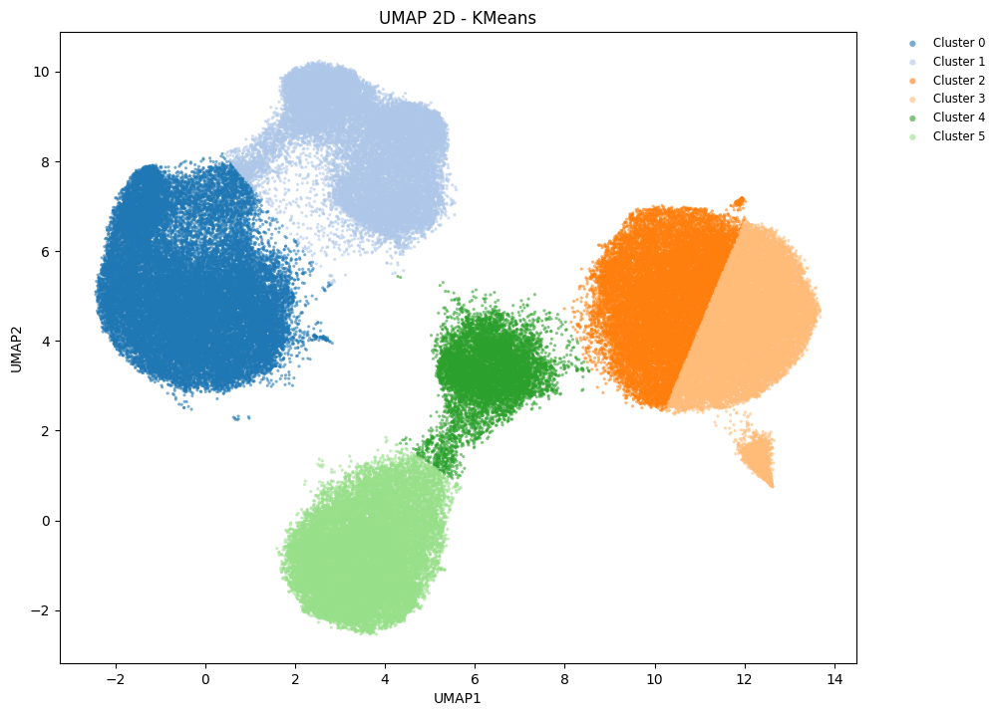

In [17]:
labels_path = '/nfs/bartesaghilab2/ds672/empiar10076/experiments/2025_06_05_z8_ds128_par_92x_exp4/analysis_diego.49/kmeans6_umap/labels.pkl'
with open(labels_path, 'rb') as archivo:
    labels_ = pickle.load(archivo)
print(labels_)
plot_clusters(umap_, labels_, title=f"UMAP 2D - KMeans")